## Rainfall Prediction - Weather Forecasting

**Project Description**

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia. Here, predict two things:

**1. Problem Statement:**

a) Design a predictive model with the use of machine learning algorithms to forecast whether or
not it will rain tomorrow.

b) Design a predictive model with the use of machine learing algorithms to predict how much rainfall could be there.

**Dataset Description:**
Number of columns: 23

- Date - The date of observation
- Location -The common name of the location of the weather station
- MinTemp -The minimum temperature in degrees celsius
- MaxTemp - The maximum temperature in degrees celsius
- Rainfall -The amount of rainfall recorded for the day in mm
- Evaporation -The so-called Class A pan evaporation (mm) in the 24 hours to 9am
- Sunshine -The number of hours of bright sunshine in the day.
- WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight
- WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight
- WindDir 9am -Direction of the wind at 9am
- WindDir 3pm -Direction of the wind at 3pm
- WindSpeed 9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am
- WindSpeed 3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm
- Humidity 9am -Humidity (percent) at 9am

- Humidity 3pm -Humidity (percent) at 3pm
- Pressure 9am -Atmospheric pressure (ha) reduced to mean sea level at 9am
- Pressure 3pm -Atmospheric pressure (ha) reduced to mean sea level at 3pm
- Cloud 9am - Fraction of sky obscured by cloud at 9am.
- Cloud 3pm -Fraction of sky obscured by cloud
- Temp 9am-Temperature (degrees C) at 9am
- Temp 3pm -Temperature (degrees C) at 3pm
- Rain Today -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0
- Rain Tomorrow -The amount of next day rain in mm. Used to create response variable. A kind of measure of the "risk".

## Importing the Dataset:

In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv("weatherAUS.csv") #reading the data file
df #diplaying the dataset with first 5 and last 5 

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
df.shape #The Total number of data (same as df)

(8425, 23)

In [4]:
df.columns #to see the columns names

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [5]:
df.head() #to see 5 first row of dataset

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


## EDA

### Checking for NULL values if any in the data frame

np.nan, None, NaN and others..

In [6]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

- we see a significant amount of null values in the dataset, we see that evaporation and sunshine have the highest null values
- we see that the null values in cloud9am and 3pm also have a significant amount of nulls 
- pressure9am and pressure3am also have a large no of null values
- the only 2 columns which do not have nulls are date as well as location
- next step is to understand each of the columns to know how to treat them , domain knowledge is needed


In [7]:
print (df.info()) #to check for null Values 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

We have rechecked again and found the same null values as we saw and we will have to remove them to proceed further

In [8]:
# to Check unique values of each column
df.nunique()

Date             3004
Location           12
MinTemp           285
MaxTemp           331
Rainfall          250
Evaporation       116
Sunshine          140
WindGustDir        16
WindGustSpeed      52
WindDir9am         16
WindDir3pm         16
WindSpeed9am       34
WindSpeed3pm       35
Humidity9am        90
Humidity3pm        94
Pressure9am       384
Pressure3pm       374
Cloud9am            9
Cloud3pm            9
Temp9am           304
Temp3pm           328
RainToday           2
RainTomorrow        2
dtype: int64

In [9]:
df['Location'].unique()

array(['Albury', 'CoffsHarbour', 'Newcastle', 'Penrith', 'Williamtown',
       'Wollongong', 'Melbourne', 'Brisbane', 'Adelaide', 'PerthAirport',
       'Darwin', 'Uluru'], dtype=object)

In [10]:
# to check the value count of each column to see if there are any unexpected and unwanted entries present in the column.
for i in df.columns:
        print(df[i].value_counts())
        print('****************************************')

2011-01-31    5
2011-05-08    5
2011-05-21    5
2011-05-20    5
2011-05-19    5
             ..
2013-01-28    1
2013-01-29    1
2013-01-30    1
2013-01-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64
****************************************
Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64
****************************************
 12.0    74
 13.2    71
 13.8    69
 12.7    68
 16.4    67
         ..
 0.3      1
 28.3     1
-1.1      1
-1.4      1
 26.0     1
Name: MinTemp, Length: 285, dtype: int64
****************************************
19.0    87
23.8    75
19.8    74
25.0    71
22.0    68
        ..
11.2     1
43.1     1
42.7     1
42.9     1
43.5     1
Name: MaxTemp, Length: 331, dtype: int64
****************************************
0.0  

In [11]:
# to change date data type
df['Date'] = pd.to_datetime(df['Date'])

In [12]:
# to check datatype
df.dtypes

Date             datetime64[ns]
Location                 object
MinTemp                 float64
MaxTemp                 float64
Rainfall                float64
Evaporation             float64
Sunshine                float64
WindGustDir              object
WindGustSpeed           float64
WindDir9am               object
WindDir3pm               object
WindSpeed9am            float64
WindSpeed3pm            float64
Humidity9am             float64
Humidity3pm             float64
Pressure9am             float64
Pressure3pm             float64
Cloud9am                float64
Cloud3pm                float64
Temp9am                 float64
Temp3pm                 float64
RainToday                object
RainTomorrow             object
dtype: object

In [13]:
# to Extract Day from Date_of_journey column
df['Day'] = pd.to_datetime(df.Date,format="%d/%m/%Y").dt.day

# to Extract Month from Date_of_journey column
df['Month'] = pd.to_datetime(df.Date, format="%d/%m/%Y").dt.month

# to Extract Year from Date_of_journey column
df['Year'] = pd.to_datetime(df.Date, format="%d/%m/%Y").dt.year

In [14]:
df.drop(columns=['Date'],axis=1,inplace=True)

In [15]:
df.head(2)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,...,1007.1,8.0,NaN,16.9,21.8,No,No,1,12,2008
1,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,...,1007.8,NaN,NaN,17.2,24.3,No,No,2,12,2008


In [16]:
#Filling null values in MinTemp with it's mean
df['MinTemp'] = df['MinTemp'].fillna(df['MinTemp'].mean())

#Filling null values in MaxTemp with it's mean
df['MaxTemp'] = df['MaxTemp'].fillna(df['MaxTemp'].mean())

#Fillinf null values in Rainfall with it's mode, as most of the rows have 0 rainfall.
df['Rainfall'] = df['Rainfall'].fillna(df['Rainfall'].mode()[0])

#Filling null values in Evaporation with it's mean
df['Evaporation'] = df['Evaporation'].fillna(df['Evaporation'].mean())

#Filling null values in Sunshine with it's mean
df['Sunshine'] = df['Sunshine'].fillna(df['Sunshine'].mean())

#Filling null values in WindGustDir with it's mode
df['WindGustDir'] = df['WindGustDir'].fillna(df['WindGustDir'].mode()[0])

#Filling null values in WindGustSpeed with it's mean
df['WindGustSpeed'] = df['WindGustSpeed'].fillna(df['WindGustSpeed'].mean())

#Filling null values in WindDir9am with it's mode
df['WindDir9am'] = df['WindDir9am'].fillna(df['WindDir9am'].mode()[0])

#Filling null values in WindDir3pm with it's mode
df['WindDir3pm'] = df['WindDir3pm'].fillna(df['WindDir3pm'].mode()[0])

#Filling null values in WindSpeed9am with it's mean
df['WindSpeed9am'] = df['WindSpeed9am'].fillna(df['WindSpeed9am'].mean())

#Filling null values in WindSpeed3pm with it's mean
df['WindSpeed3pm'] = df['WindSpeed3pm'].fillna(df['WindSpeed3pm'].mean())

#Filling null values in Humidity9am with it's mean
df['Humidity9am'] = df['Humidity9am'].fillna(df['Humidity9am'].mean())

#Filling null values in Humidity3pm with it's mean
df['Humidity3pm'] = df['Humidity3pm'].fillna(df['Humidity3pm'].mean())

#Filling null values in Pressure9am with it's mean
df['Pressure9am'] = df['Pressure9am'].fillna(df['Pressure9am'].mean())

#Filling null values in Pressure3pm with it's mean
df['Pressure3pm'] = df['Pressure3pm'].fillna(df['Pressure3pm'].mean())

#Filling null values in Cloud9am with it's mean
df['Cloud9am'] = df['Cloud9am'].fillna(df['Cloud9am'].mean())

#Filling null values in Cloud3pm with it's mean
df['Cloud3pm'] = df['Cloud3pm'].fillna(df['Cloud3pm'].mean())

#Filling null values in Temp9am with it's mean
df['Temp9am'] = df['Temp9am'].fillna(df['Temp9am'].mean())

#Filling null values in Temp3pm with it's mean
df['Temp3pm'] = df['Temp3pm'].fillna(df['Temp3pm'].mean())

#Filling null values in Temp3pm with it's mean
df['Temp3pm'] = df['Temp3pm'].fillna(df['Temp3pm'].mean())

#Filling null values in RainToday with it's mode
df['RainToday'] = df['RainToday'].fillna(df['RainToday'].mode()[0])

#Filling null values in RainTomorrow with it's mode
df['RainTomorrow'] = df['RainTomorrow'].fillna(df['RainTomorrow'].mode()[0])

In [17]:
# to check null values after replacing them with mean and mode
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
Day              0
Month            0
Year             0
dtype: int64

In [18]:
df.drop_duplicates(inplace=True)

In [19]:
df.shape

(6762, 25)

We see there are a lot of duplicate values so we removed them and moving to check the data loss

In [20]:
Data_loss = ((8425-6762)/8425)*100
Data_loss

19.73887240356083

We see that after we removed the null values and the duplicates we end up with 6762 rows and the data lost is 19.74 approx , which is  high but as we cant do anything about the data and we cant proceed with model building with nulls and duplicates so  we have had to treat them

In [21]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
count,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000,6762.000000
mean,13.110016,24.096335,2.723410,5.339977,7.767098,39.144388,12.792133,17.585384,67.509082,50.478258,1017.629004,1015.142442,4.400224,4.372235,17.894035,22.704947,15.737208,6.462141,2012.052203
std,5.540673,6.130161,10.490138,3.343991,2.736693,13.382876,9.788112,9.549341,17.182723,18.498573,6.027916,5.967815,2.476781,2.324720,5.722423,5.971925,8.793898,3.377471,2.301057
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000,1.000000,1.000000,2008.000000
25%,9.000000,19.600000,0.000000,4.000000,7.632205,30.000000,6.000000,11.000000,56.000000,38.000000,1014.200000,1011.500000,2.000000,3.000000,13.900000,18.400000,8.000000,4.000000,2010.000000
50%,13.193305,23.500000,0.000000,5.389395,7.632205,39.000000,11.000000,17.000000,68.000000,50.000000,1017.640233,1015.236075,4.566622,4.503183,17.900000,22.300000,16.000000,6.000000,2012.000000
75%,17.400000,28.400000,0.800000,5.389395,9.200000,46.000000,19.000000,24.000000,80.000000,62.000000,1020.900000,1018.400000,7.000000,6.000000,22.200000,26.800000,23.000000,9.000000,2014.000000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000,31.000000,12.000000,2017.000000


## Visualization:

In [22]:
#checking categorical columns
cat_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        cat_col.append(i)
print(cat_col)

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']


In [23]:
# checking for numerical columns
num_col=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        num_col.append(i)
print(num_col)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Day', 'Month', 'Year']


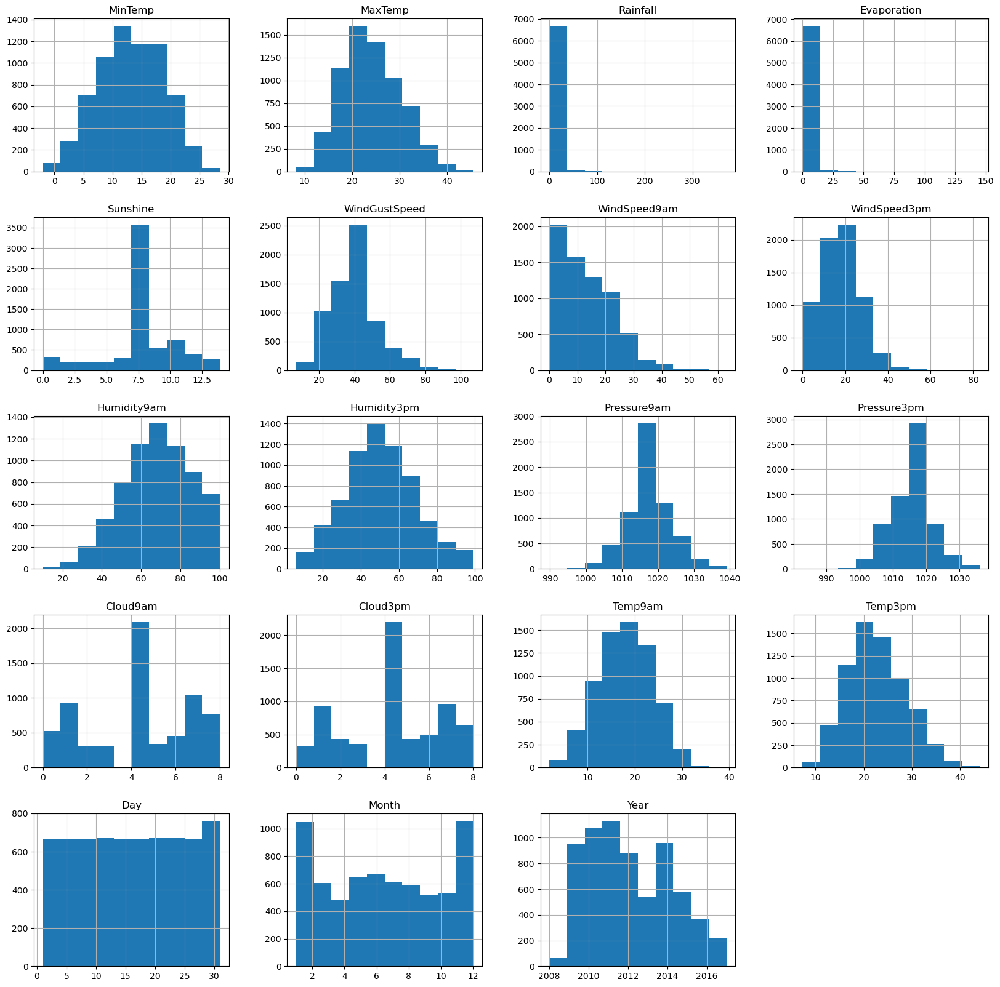

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

df.hist(figsize=(20,20))
plt.show()

- Min Temp is normally distributed
- Max Temp is slightly skewed right
- Rainfall is skewed right
- Evaporation is skewed right
- Sunshine is not normally distributed
- WindGustSpeed, WindSpeed9am,WindSpeed3pm is skewed right
- Humidity9am is slightly skewed left and Humidity3pm is normally distributed.
- Pressure9am, Pressure3pm, Cloud9am, Cloud3pm,Temp9am,Temp3pm,Day, Month and Year has no skewness however the data is not distributed normally

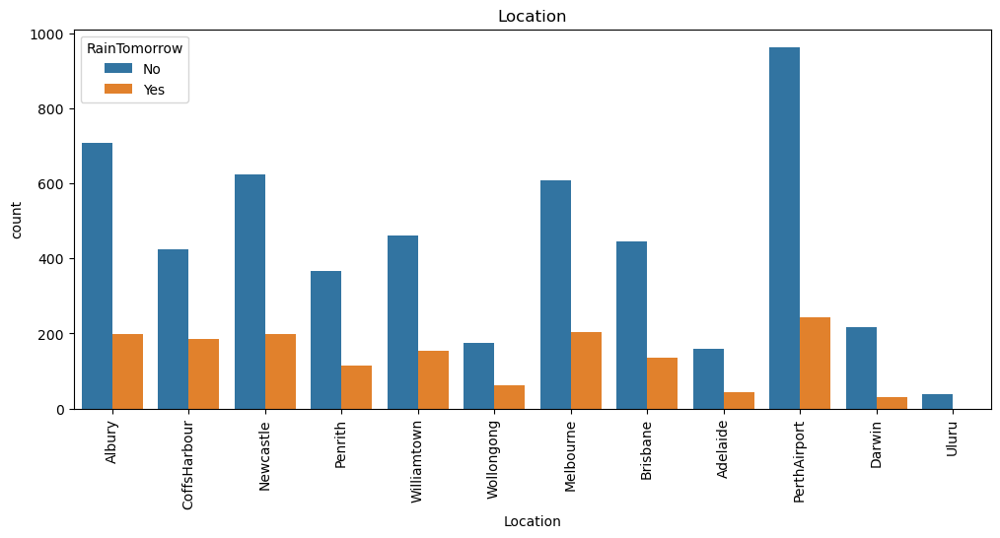

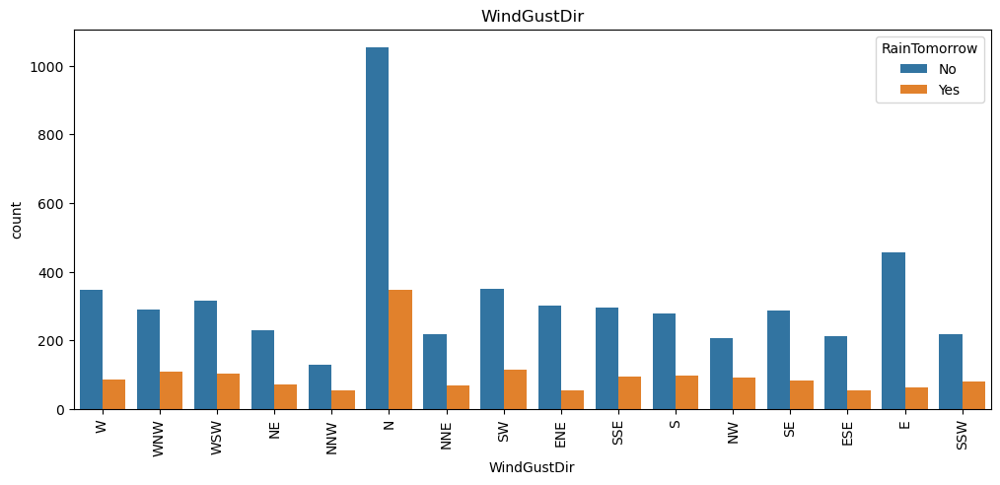

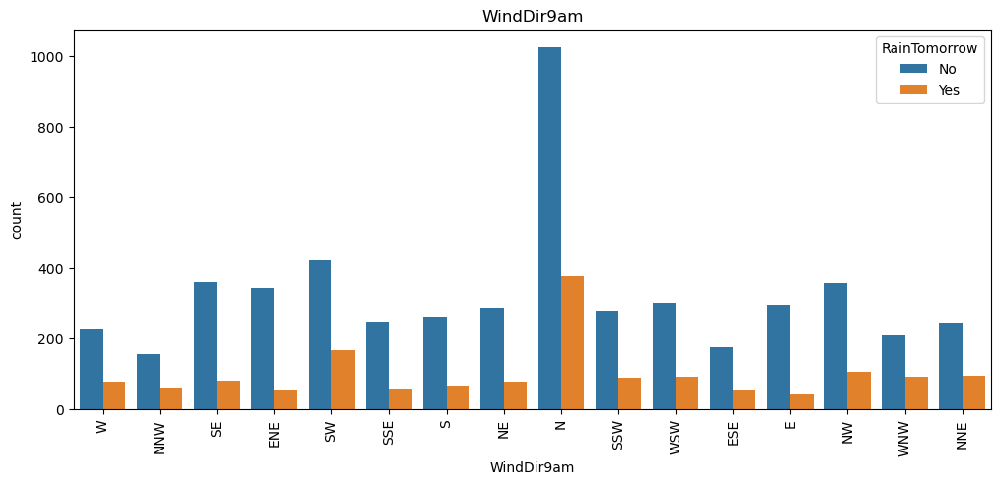

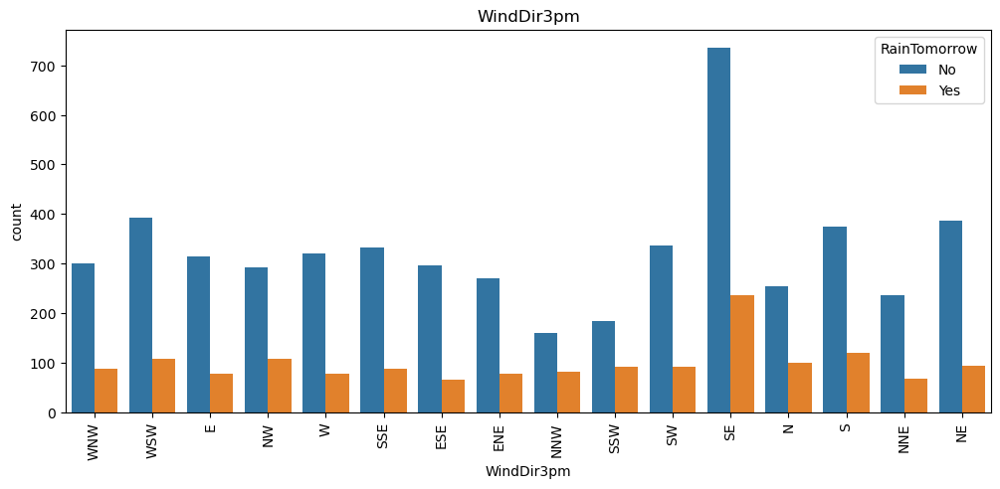

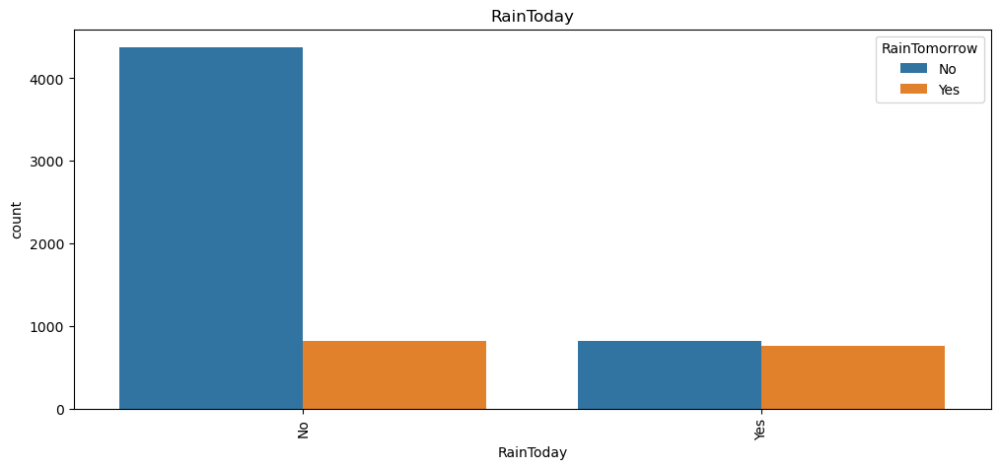

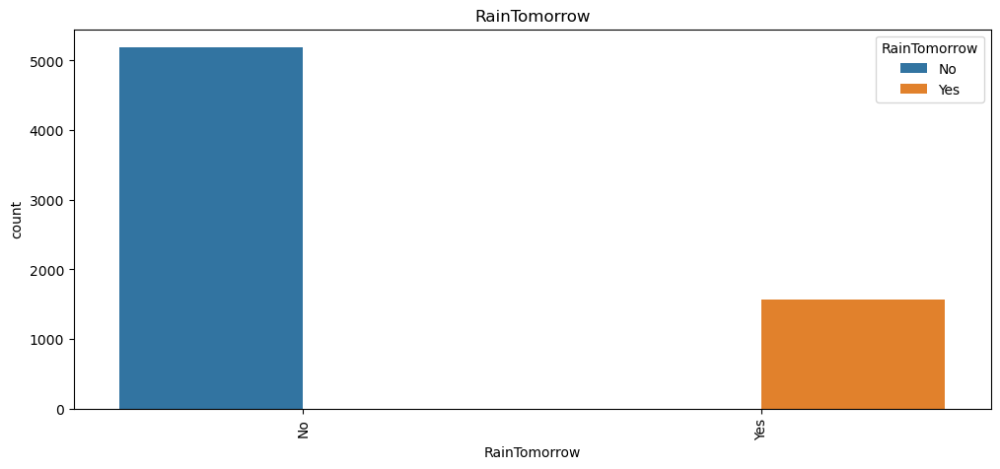

In [25]:
#Distribution plot for all categorical_columns
for i in df[cat_col]:              
    plt.figure(figsize = (12, 5))
    sns.countplot(x= df[i], hue = 'RainTomorrow',data= df)
    plt.title(i)
    plt.xticks(rotation=90);
    plt.show()

- Highest rainfall data from Melbourbne and least from Uluru
- We can clearly see that the wind gust was strongest towards the north, followed by the SW, SSE, S,WNW.
- In the plots we can clearly see that the wing direction was towards the N at 9am and in the SE at 3pm
- We can hardy see any difference in the rainfall today and tomorrow.

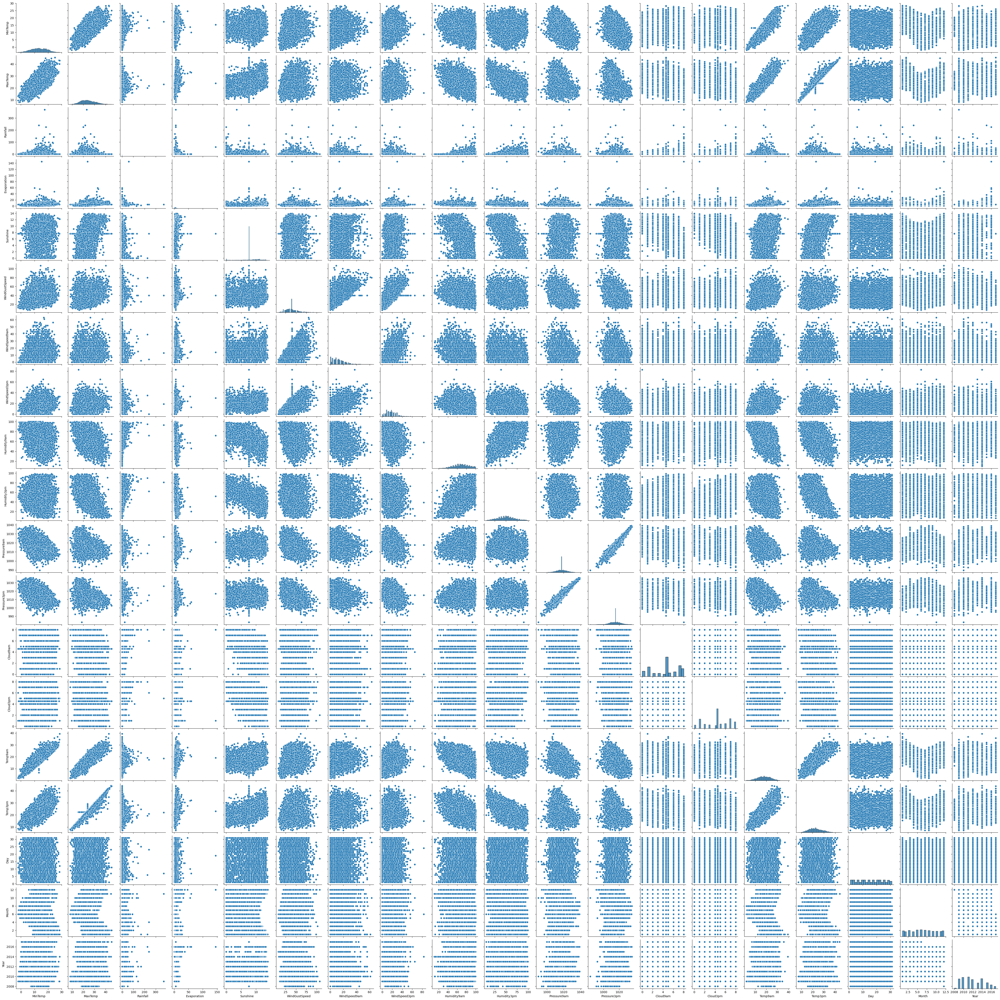

In [26]:
sns.pairplot(df)

There is linear relationship between columns and there are many outliers also present in dataset.

## Identifying the Outliers

MinTemp             AxesSubplot(0.125,0.747241;0.133621x0.132759)
MaxTemp          AxesSubplot(0.285345,0.747241;0.133621x0.132759)
Rainfall          AxesSubplot(0.44569,0.747241;0.133621x0.132759)
Evaporation      AxesSubplot(0.606034,0.747241;0.133621x0.132759)
Sunshine         AxesSubplot(0.766379,0.747241;0.133621x0.132759)
WindGustSpeed       AxesSubplot(0.125,0.587931;0.133621x0.132759)
WindSpeed9am     AxesSubplot(0.285345,0.587931;0.133621x0.132759)
WindSpeed3pm      AxesSubplot(0.44569,0.587931;0.133621x0.132759)
Humidity9am      AxesSubplot(0.606034,0.587931;0.133621x0.132759)
Humidity3pm      AxesSubplot(0.766379,0.587931;0.133621x0.132759)
Pressure9am         AxesSubplot(0.125,0.428621;0.133621x0.132759)
Pressure3pm      AxesSubplot(0.285345,0.428621;0.133621x0.132759)
Cloud9am          AxesSubplot(0.44569,0.428621;0.133621x0.132759)
Cloud3pm         AxesSubplot(0.606034,0.428621;0.133621x0.132759)
Temp9am          AxesSubplot(0.766379,0.428621;0.133621x0.132759)
Temp3pm   

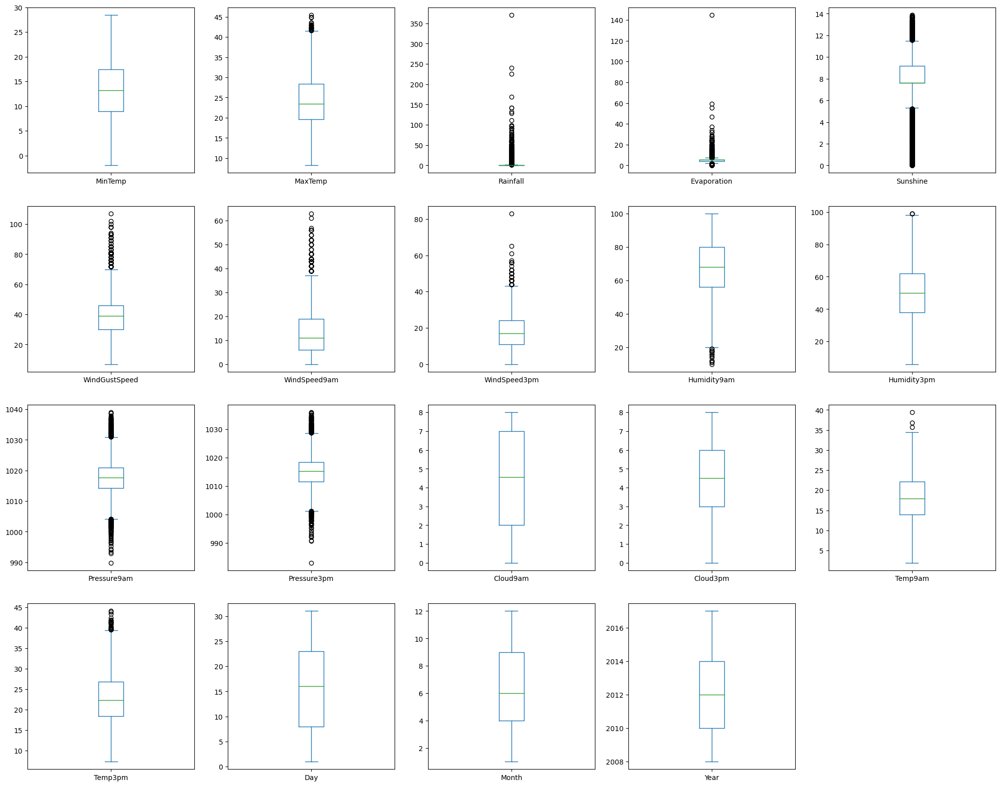

In [27]:
# to find out outliers in the dataset
df.plot(kind='box',subplots=True,layout=(5,5),figsize=(25,25))

From the above boxplots, we can see that features having outliers are: MaxTemp, Rainfall, Evaporation, Sunshine, WindGustSpeed, WindSpeed9am,Windspeed3pm, Humidity9am, Pressure9am, Pressure3pm, Temp9am, Temp3pm

#### Lets remove the outliers

In [28]:
feature = df[['MaxTemp','Rainfall','Evaporation','Sunshine','WindGustSpeed','WindSpeed9am','WindSpeed3pm','Humidity9am','Pressure9am','Pressure3pm','Temp9am','Temp3pm']]

## i) Zscore method:

In [29]:
from scipy.stats import zscore
# removing outliers with zscore
z=np.abs(zscore(feature))
df_new=df[(z<3).all(axis=1)]

In [30]:
df_new.shape

(6407, 25)

In [31]:
df.shape

(6762, 25)

In [32]:
#Checking dataloss in zscore method
Dataloss=(((6762-6407)/6762)*100)
Dataloss

5.249926057379473

### Checking for skewness:

In [33]:
#Checking for skewness
df_new.skew()

MinTemp         -0.079106
MaxTemp          0.266904
Rainfall         3.521311
Evaporation      0.666033
Sunshine        -0.745663
WindGustSpeed    0.433805
WindSpeed9am     0.673685
WindSpeed3pm     0.336064
Humidity9am     -0.233630
Humidity3pm      0.154806
Pressure9am      0.062624
Pressure3pm      0.078028
Cloud9am        -0.278808
Cloud3pm        -0.212133
Temp9am         -0.071385
Temp3pm          0.291970
Day              0.004932
Month            0.032783
Year             0.352752
dtype: float64

We can see that features Rainfall, Sunshine, Evaporation, Windspeed9am, Windgustspeed has skewness.

## Removing skewness using log transformation

In [34]:
df_new["Sunshine"] = np.log1p(df_new["Sunshine"])
df_new["Rainfall"] = np.log1p(df_new["Rainfall"])
df_new["Evaporation"] = np.log1p(df_new["Evaporation"])
df_new["WindSpeed9am"] = np.log1p(df_new["WindSpeed9am"])
df_new["WindGustSpeed"] = np.log1p(df_new["WindGustSpeed"])

In [35]:
#checking skewness again
df_new.skew()

MinTemp         -0.079106
MaxTemp          0.266904
Rainfall         1.838505
Evaporation     -1.042515
Sunshine        -2.644650
WindGustSpeed   -0.602223
WindSpeed9am    -1.059502
WindSpeed3pm     0.336064
Humidity9am     -0.233630
Humidity3pm      0.154806
Pressure9am      0.062624
Pressure3pm      0.078028
Cloud9am        -0.278808
Cloud3pm        -0.212133
Temp9am         -0.071385
Temp3pm          0.291970
Day              0.004932
Month            0.032783
Year             0.352752
dtype: float64

##### Encoding the categorical columns

In [36]:
from sklearn.preprocessing import LabelEncoder

In [37]:
le=LabelEncoder()
df_new[cat_col]= df_new[cat_col].apply(le.fit_transform)
df_new

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.900000,0.470004,1.85464,2.1555,13,3.806662,13,14,...,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.100000,0.000000,1.85464,2.1555,14,3.806662,6,15,...,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.700000,0.000000,1.85464,2.1555,15,3.850148,13,15,...,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.000000,0.000000,1.85464,2.1555,4,3.218876,9,0,...,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.300000,0.693147,1.85464,2.1555,13,3.737670,1,7,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,9,2.8,23.400000,0.000000,1.85464,2.1555,0,3.465736,9,1,...,1020.3,4.566622,4.503183,10.1,22.4,0,0,21,6,2017
8421,9,3.6,25.300000,0.000000,1.85464,2.1555,6,3.135494,9,3,...,1019.1,4.566622,4.503183,10.9,24.5,0,0,22,6,2017
8422,9,5.4,26.900000,0.000000,1.85464,2.1555,3,3.637586,9,14,...,1016.8,4.566622,4.503183,12.5,26.1,0,0,23,6,2017
8423,9,7.8,27.000000,0.000000,1.85464,2.1555,9,3.367296,10,3,...,1016.5,3.000000,2.000000,15.1,26.0,0,0,24,6,2017


## Checking the corelation between feature and label

In [38]:
df.corr()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Day,Month,Year
MinTemp,1.000000,0.728063,0.090967,0.267755,0.047933,0.242375,0.169559,0.187798,-0.154224,0.067502,-0.441325,-0.440888,0.087812,0.040742,0.891401,0.696614,0.014355,-0.237202,0.032967
MaxTemp,0.728063,1.000000,-0.087688,0.345830,0.361249,0.164883,0.056748,0.115482,-0.425012,-0.430741,-0.337877,-0.413459,-0.246427,-0.243364,0.866615,0.974843,0.016083,-0.171805,0.081412
Rainfall,0.090967,-0.087688,1.000000,0.000526,-0.188613,0.088968,0.050370,0.020183,0.227951,0.242908,-0.071062,-0.032658,0.191712,0.159476,-0.004340,-0.091880,-0.007989,-0.015187,-0.008516
Evaporation,0.267755,0.345830,0.000526,1.000000,0.262840,0.162834,0.129189,0.110119,-0.242224,-0.189347,-0.201735,-0.216361,-0.072151,-0.119730,0.314590,0.338812,0.009713,-0.008864,0.142162
Sunshine,0.047933,0.361249,-0.188613,0.262840,1.000000,0.013039,0.024077,0.059477,-0.388966,-0.446497,-0.003533,-0.059875,-0.551186,-0.568954,0.246864,0.379144,0.001801,-0.004769,0.049631
WindGustSpeed,0.242375,0.164883,0.088968,0.162834,0.013039,1.000000,0.584105,0.615217,-0.265362,-0.092423,-0.394086,-0.363669,0.007703,0.053480,0.221060,0.129193,-0.003636,0.050615,-0.018529
WindSpeed9am,0.169559,0.056748,0.050370,0.129189,0.024077,0.584105,1.000000,0.550823,-0.373019,-0.121612,-0.178226,-0.150283,-0.029866,0.017166,0.152232,0.042101,-0.004412,0.028972,-0.102890
WindSpeed3pm,0.187798,0.115482,0.020183,0.110119,0.059477,0.615217,0.550823,1.000000,-0.259666,-0.100742,-0.248678,-0.210676,-0.017944,-0.024235,0.207468,0.093010,-0.011794,0.059842,-0.075419
Humidity9am,-0.154224,-0.425012,0.227951,-0.242224,-0.388966,-0.265362,-0.373019,-0.259666,1.000000,0.639582,0.137395,0.175130,0.419228,0.320593,-0.407536,-0.418130,0.006462,-0.097197,0.081610
Humidity3pm,0.067502,-0.430741,0.242908,-0.189347,-0.446497,-0.092423,-0.121612,-0.100742,0.639582,1.000000,-0.006298,0.061527,0.423375,0.451996,-0.137051,-0.500423,0.019372,-0.053115,-0.033982


<AxesSubplot:>

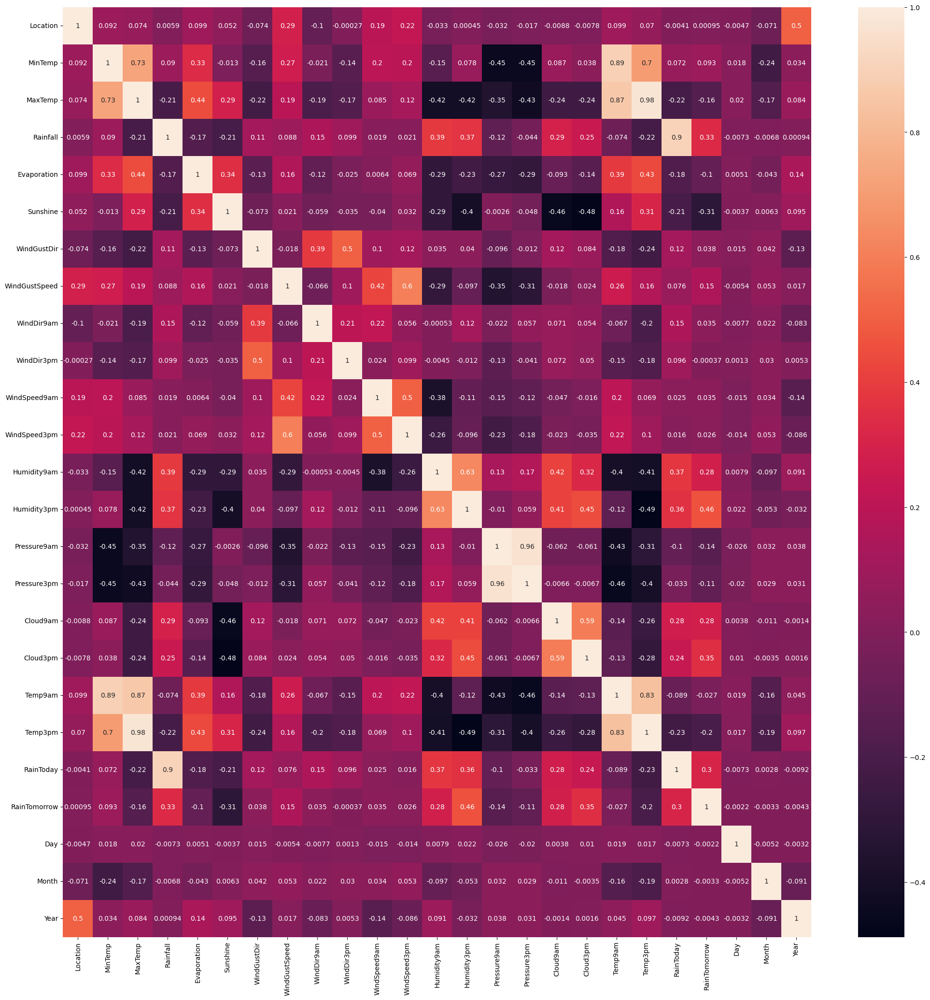

In [39]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(25,25))
sns.heatmap(df_new.corr(),color ='k',annot=True)


## Splitting feature and label into x and y


In [40]:
x = df_new.drop("RainTomorrow", axis=1)
y = df_new["RainTomorrow"]

## Feature Scaling using Standard Scalarization


In [41]:
from sklearn.preprocessing import StandardScaler

In [42]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Day,Month,Year
0,-1.391645,0.069419,-0.190410,0.007121,0.274564,0.123134,1.248646,0.566335,1.317169,1.373565,...,-1.760082,-1.440880,1.468728,0.074527,-0.162254,-0.148996,-0.5353,-1.672094,1.655738,-1.770678
1,-1.391645,-1.013688,0.174696,-0.536481,0.274564,0.123134,1.457437,0.566335,-0.222773,1.596824,...,-1.253105,-1.317380,0.082301,0.074527,-0.109503,0.276985,-0.5353,-1.558323,1.655738,-1.770678
2,-1.391645,-0.020840,0.274270,-0.536481,0.274564,0.123134,1.666229,0.696806,1.317169,1.596824,...,-1.777564,-1.158594,0.082301,-1.003562,0.558678,0.089554,-0.5353,-1.444552,1.655738,-1.770678
3,-1.391645,-0.688756,0.655972,-0.536481,0.274564,0.123134,-0.630482,-1.197233,0.437202,-1.752064,...,-0.029368,-0.435235,0.082301,0.074527,0.048751,0.651848,-0.5353,-1.330782,1.655738,-1.770678
4,-1.391645,0.809542,1.369588,0.265206,0.274564,0.123134,1.248646,0.359332,-1.322732,-0.189249,...,-1.218141,-1.634952,1.064920,1.580562,-0.004000,1.197104,-0.5353,-1.217011,1.655738,-1.770678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6402,1.203028,-1.844070,-0.107431,-0.536481,0.274564,0.123134,-1.465650,-0.456565,0.437202,-1.528805,...,1.194369,0.887982,0.082301,0.074527,-1.357946,-0.046760,-0.5353,0.603320,-0.134393,2.169074
6403,1.203028,-1.699656,0.207888,-0.536481,0.274564,0.123134,-0.212898,-1.447408,0.437202,-1.082286,...,1.002068,0.676267,0.082301,0.074527,-1.217276,0.311064,-0.5353,0.717091,-0.134393,2.169074
6404,1.203028,-1.374724,0.473419,-0.536481,0.274564,0.123134,-0.839274,0.059046,0.437202,1.373565,...,0.565019,0.270480,0.082301,0.074527,-0.935937,0.583692,-0.5353,0.830862,-0.134393,2.169074
6405,1.203028,-0.941481,0.490015,-0.536481,0.274564,0.123134,0.413478,-0.751920,0.657194,-1.082286,...,0.285307,0.217552,-0.550314,-1.003562,-0.478760,0.566652,-0.5353,0.944633,-0.134393,2.169074


## Checking VIF (Multicolinearity)

In [43]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [44]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.639063,Location
1,9.115323,MinTemp
2,26.386865,MaxTemp
3,5.663714,Rainfall
4,1.500680,Evaporation
5,1.651206,Sunshine
6,1.642183,WindGustDir
7,2.045900,WindGustSpeed
8,1.387886,WindDir9am
9,1.485367,WindDir3pm


We can see that we have high multicolinearity in features: MaxTemp, Pressure9am, Pressure3pm, Temp9am, Temp3pm.

In [45]:
# Dropping Temp3pm column
x.drop("Temp3pm",axis=1,inplace=True)

In [46]:
# Dropping Pressure9am column
x.drop("Pressure9am",axis=1,inplace=True)

In [47]:
# Dropping Temp9am column
x.drop("Temp9am",axis=1,inplace=True)

In [48]:
#checking vif again
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.634103,Location
1,4.754378,MinTemp
2,5.488565,MaxTemp
3,5.643815,Rainfall
4,1.473701,Evaporation
5,1.638491,Sunshine
6,1.619289,WindGustDir
7,1.990357,WindGustSpeed
8,1.360724,WindDir9am
9,1.421201,WindDir3pm


Now we can see that we have removed all the multi-colinearity and it dont exist in the dataset

## Oversampling

In [49]:
y.value_counts()

0    4979
1    1428
Name: RainTomorrow, dtype: int64

In [50]:
y.value_counts()

0    4979
1    1428
Name: RainTomorrow, dtype: int64

## Finding the best random state

In [51]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from sklearn.ensemble import RandomForestRegressor,ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import BaggingRegressor


from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier,ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier

from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn import metrics

In [52]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state =i)
    rf = RandomForestClassifier()
    rf.fit(x_train, y_train)
    pred = rf.predict(x_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.8668746749869994  on Random_state  74


In [53]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=maxRS)

In [54]:
lr = LogisticRegression()
lr.fit(x_train,y_train)

# Prediction
predlr = lr.predict(x_test)

print(accuracy_score(y_test, predlr))
print(confusion_matrix(y_test, predlr))
print(classification_report(y_test,predlr))

0.8554342173686947
[[1455   88]
 [ 190  190]]
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      1543
           1       0.68      0.50      0.58       380

    accuracy                           0.86      1923
   macro avg       0.78      0.72      0.75      1923
weighted avg       0.84      0.86      0.85      1923



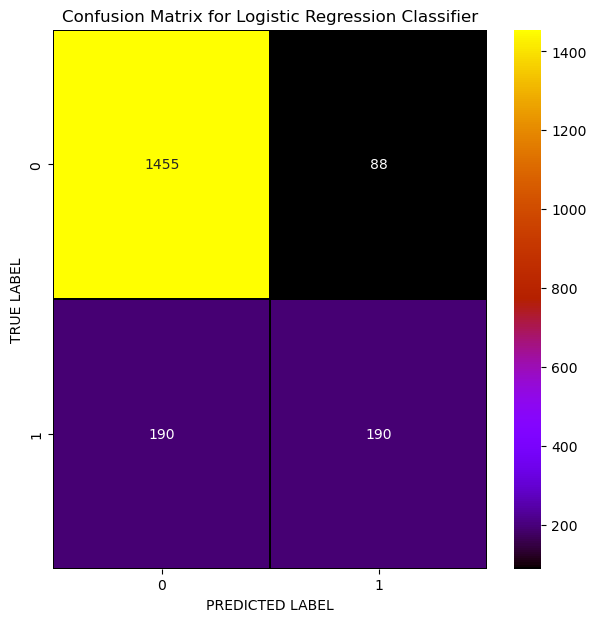

In [55]:
# Lets plot confusion matrix for Logistic Regression
cm = confusion_matrix(y_test,predlr)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="gnuplot",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Logistic Regression Classifier')
plt.show()

In [56]:
rf = RandomForestClassifier()
rf.fit(x_train,y_train)

# Prediction
predrf = rf.predict(x_test)

print(accuracy_score(y_test, predrf))
print(confusion_matrix(y_test, predrf))
print(classification_report(y_test,predrf))

0.8647945917836714
[[1472   71]
 [ 189  191]]
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      1543
           1       0.73      0.50      0.60       380

    accuracy                           0.86      1923
   macro avg       0.81      0.73      0.76      1923
weighted avg       0.86      0.86      0.85      1923



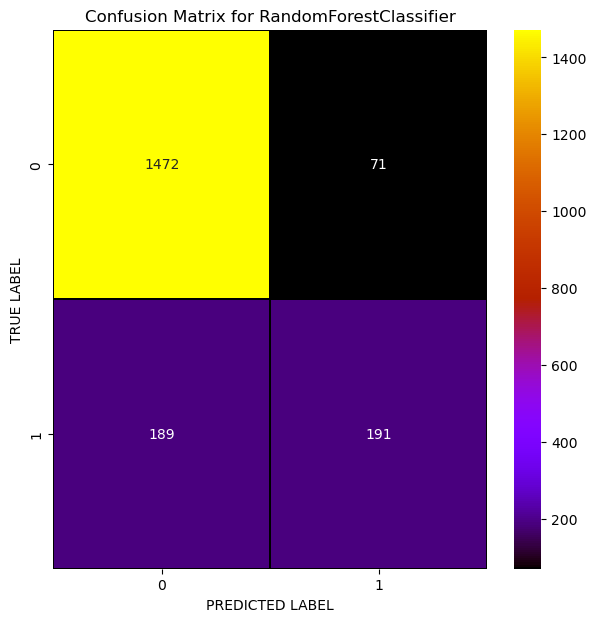

In [57]:
# Lets plot confusion matrix for RandomForestClassifier
cm = confusion_matrix(y_test,predrf)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="gnuplot",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for RandomForestClassifier')
plt.show()

In [58]:
# Checking accuracy for AdaBoost Classifier
abc = AdaBoostClassifier()
abc.fit(x_train,y_train)

# Prediction
predabc = abc.predict(x_test)

print(accuracy_score(y_test, predabc))
print(confusion_matrix(y_test, predabc))
print(classification_report(y_test,predabc))

0.8533541341653667
[[1446   97]
 [ 185  195]]
              precision    recall  f1-score   support

           0       0.89      0.94      0.91      1543
           1       0.67      0.51      0.58       380

    accuracy                           0.85      1923
   macro avg       0.78      0.73      0.75      1923
weighted avg       0.84      0.85      0.85      1923



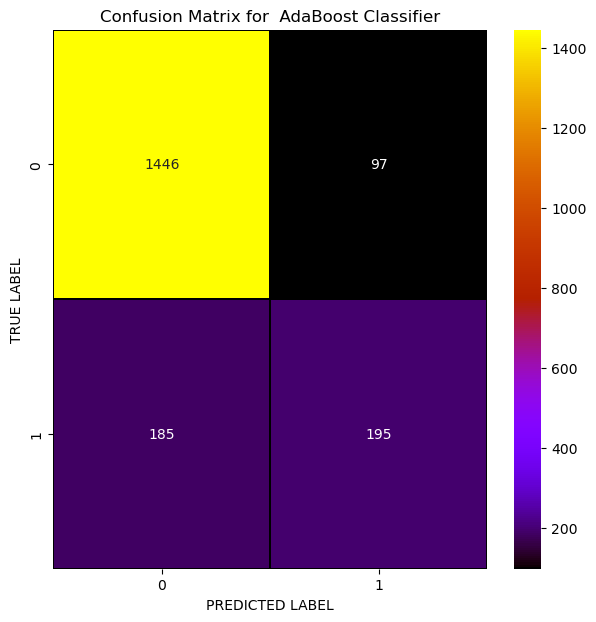

In [59]:
# Lets plot confusion matrix for  AdaBoost Classifier
cm = confusion_matrix(y_test,predabc)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="gnuplot",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  AdaBoost Classifier')
plt.show()

In [60]:
gb = GradientBoostingClassifier()
gb.fit(x_train,y_train)

# Prediction
predgb = gb.predict(x_test)

print(accuracy_score(y_test, predgb))
print(confusion_matrix(y_test, predgb))
print(classification_report(y_test,predgb))

0.860114404576183
[[1461   82]
 [ 187  193]]
              precision    recall  f1-score   support

           0       0.89      0.95      0.92      1543
           1       0.70      0.51      0.59       380

    accuracy                           0.86      1923
   macro avg       0.79      0.73      0.75      1923
weighted avg       0.85      0.86      0.85      1923



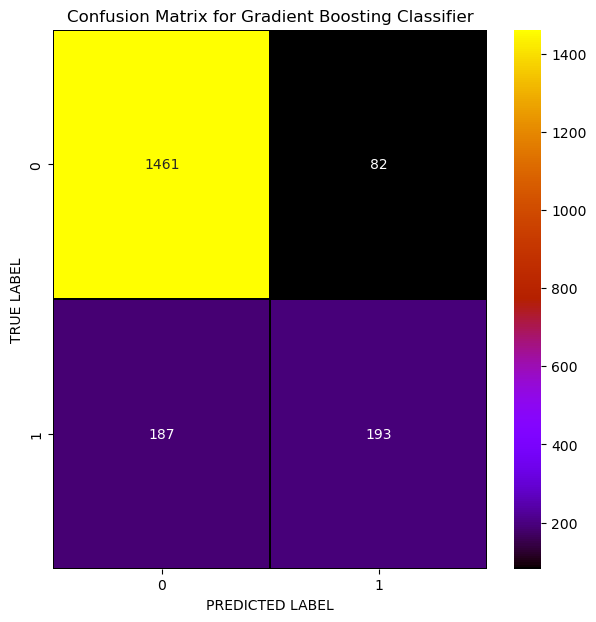

In [61]:
# Lets plot confusion matrix for Gradient Boosting Classifier
cm = confusion_matrix(y_test,predgb)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="gnuplot",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

In [62]:
# Checking accuracy for ExtraTreesClassifier
xtc = ExtraTreesClassifier()
xtc.fit(x_train,y_train)

# Prediction
predxtc = xtc.predict(x_test)

print(accuracy_score(y_test, predxtc))
print(confusion_matrix(y_test, predxtc))
print(classification_report(y_test,predxtc))

0.8611544461778471
[[1474   69]
 [ 198  182]]
              precision    recall  f1-score   support

           0       0.88      0.96      0.92      1543
           1       0.73      0.48      0.58       380

    accuracy                           0.86      1923
   macro avg       0.80      0.72      0.75      1923
weighted avg       0.85      0.86      0.85      1923



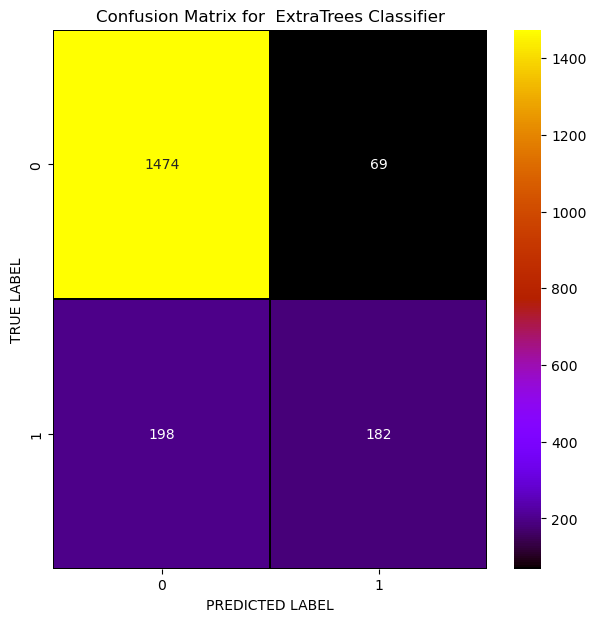

In [63]:
# Lets plot confusion matrix for  ExtraTreesClassifier
cm = confusion_matrix(y_test,predxtc)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="gnuplot",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  ExtraTrees Classifier')
plt.show()

In [64]:
# cv score for Logistic Regression
print('Logistic Regression:',cross_val_score(lr,x,y,cv=5).mean())

# cv score for Random Forest Classifier
print('Random Forest Classifier:',cross_val_score(rf,x,y,cv=5).mean())

# cv score for AdaBoosting Classifier
print('AdaBoosting Classifier:',cross_val_score(abc,x,y,cv=5).mean())

# cv score for Gradient Boosting Classifier
print('Gradient Boosting Classifier:',cross_val_score(gb,x,y,cv=5).mean())

# cv score for Extra Trees Classifier
print('Extra Trees Classifier:',cross_val_score(xtc,x,y,cv=5).mean())

Logistic Regression: 0.8226923924732163
Random Forest Classifier: 0.80333300451456
AdaBoosting Classifier: 0.7910024222982971
Gradient Boosting Classifier: 0.7975543190345882
Extra Trees Classifier: 0.8077053199223988


# HyperParameter Tuning of the best fit model

In [65]:
# ExtraTrees Classifier
parameters = {'criterion' : ['gini','entropy'],
              'random_state' : [10, 50, 1000],
              'max_depth' : [0, 10, 20],
              'n_jobs' : [-2, -1, 1],
              'n_estimators' : [50,100, 200, 300]}

In [66]:
GCV=GridSearchCV(RandomForestClassifier(),parameters,cv=5)

In [67]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [0, 10, 20],
                         'n_estimators': [50, 100, 200, 300],
                         'n_jobs': [-2, -1, 1],
                         'random_state': [10, 50, 1000]})

In [68]:
GCV.best_params_

{'criterion': 'gini',
 'max_depth': 20,
 'n_estimators': 100,
 'n_jobs': -2,
 'random_state': 10}

In [69]:
Rainfall_Tomorrow=RandomForestClassifier(criterion='gini', max_depth=20, n_estimators=200, n_jobs=-2, random_state=1000)
Rainfall_Tomorrow.fit(x_train, y_train)
pred = Rainfall_Tomorrow.predict(x_test)
acc=accuracy_score(y_test,pred)
print(acc*100)

86.79147165886636


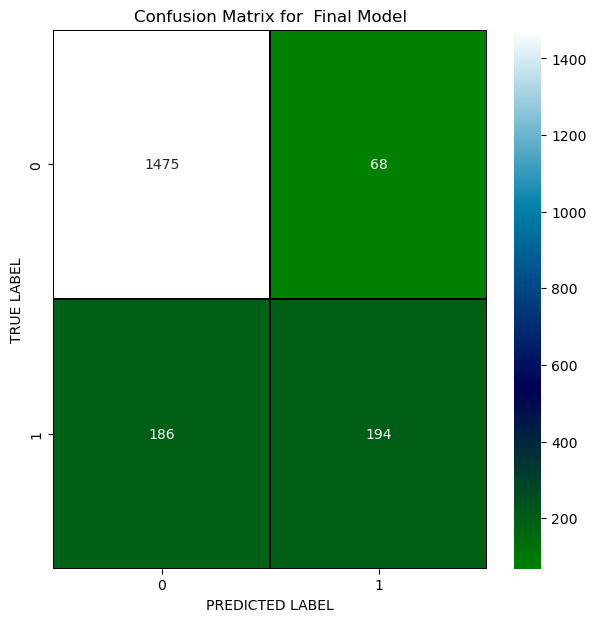

In [70]:
# Lets plot confusion matrix for  FinalModel
cm = confusion_matrix(y_test,pred)

x_axis_labels = ["0","1"]
y_axis_labels = ["0","1"]

f , ax = plt.subplots(figsize=(7,7))
sns.heatmap(cm, annot = True,linewidths=.2, linecolor="black", fmt = ".0f", ax=ax, cmap="ocean",xticklabels=x_axis_labels,yticklabels=y_axis_labels)

plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for  Final Model')
plt.show() 

# Plotting ROC and Compare AUC for the best model

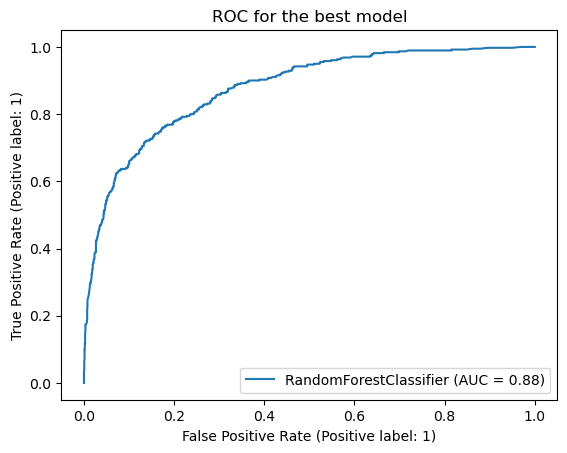

In [71]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(Rainfall_Tomorrow, x_test, y_test)
plt.title("ROC for the best model")
plt.show()

## Saving the Model


In [72]:
import joblib
joblib.dump(Rainfall_Tomorrow,"Prediction_of_Rainfall_Tomorrow.pkl")

['Prediction_of_Rainfall_Tomorrow.pkl']

In [73]:
# Loading the saved model
model=joblib.load("Prediction_of_Rainfall_Tomorrow.pkl")

#Prediction
prediction = model.predict(x_test)
prediction

array([0, 0, 0, ..., 0, 1, 0])

In [74]:
pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"]).T

,Predicted,Original
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
...,...,...
1918,0,0
1919,0,0
1920,0,0
1921,1,0


# Prediction for Rainfall

## Splitting the label and feature

In [75]:
df_new.head()

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,1,13.4,22.9,0.470004,1.85464,2.1555,13,3.806662,13,14,...,1007.1,8.000000,4.503183,16.9,21.8,0,0,1,12,2008
1,1,7.4,25.1,0.000000,1.85464,2.1555,14,3.806662,6,15,...,1007.8,4.566622,4.503183,17.2,24.3,0,0,2,12,2008
2,1,12.9,25.7,0.000000,1.85464,2.1555,15,3.850148,13,15,...,1008.7,4.566622,2.000000,21.0,23.2,0,0,3,12,2008
3,1,9.2,28.0,0.000000,1.85464,2.1555,4,3.218876,9,0,...,1012.8,4.566622,4.503183,18.1,26.5,0,0,4,12,2008
4,1,17.5,32.3,0.693147,1.85464,2.1555,13,3.737670,1,7,...,1006.0,7.000000,8.000000,17.8,29.7,0,0,5,12,2008


In [76]:
x = df_new.drop("Rainfall", axis=1)
y = df_new["Rainfall"]

# Feature Scaling using Standard Scalarization

In [77]:
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
x

,Location,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,...,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Day,Month,Year
0,-1.391645,0.069419,-0.190410,0.274564,0.123134,1.248646,0.566335,1.317169,1.373565,0.824263,...,-1.440880,1.468728,0.074527,-0.162254,-0.148996,-0.5353,-0.535541,-1.672094,1.655738,-1.770678
1,-1.391645,-1.013688,0.174696,0.274564,0.123134,1.457437,0.566335,-0.222773,1.596824,-0.633137,...,-1.317380,0.082301,0.074527,-0.109503,0.276985,-0.5353,-0.535541,-1.558323,1.655738,-1.770678
2,-1.391645,-0.020840,0.274270,0.274564,0.123134,1.666229,0.696806,1.317169,1.596824,0.774714,...,-1.158594,0.082301,-1.003562,0.558678,0.089554,-0.5353,-0.535541,-1.444552,1.655738,-1.770678
3,-1.391645,-0.688756,0.655972,0.274564,0.123134,-0.630482,-1.197233,0.437202,-1.752064,0.255945,...,-0.435235,0.082301,0.074527,0.048751,0.651848,-0.5353,-0.535541,-1.330782,1.655738,-1.770678
4,-1.391645,0.809542,1.369588,0.274564,0.123134,1.248646,0.359332,-1.322732,-0.189249,-0.155825,...,-1.634952,1.064920,1.580562,-0.004000,1.197104,-0.5353,-0.535541,-1.217011,1.655738,-1.770678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6402,1.203028,-1.844070,-0.107431,0.274564,0.123134,-1.465650,-0.456565,0.437202,-1.528805,0.412493,...,0.887982,0.082301,0.074527,-1.357946,-0.046760,-0.5353,-0.535541,0.603320,-0.134393,2.169074
6403,1.203028,-1.699656,0.207888,0.274564,0.123134,-0.212898,-1.447408,0.437202,-1.082286,0.412493,...,0.676267,0.082301,0.074527,-1.217276,0.311064,-0.5353,-0.535541,0.717091,-0.134393,2.169074
6404,1.203028,-1.374724,0.473419,0.274564,0.123134,-0.839274,0.059046,0.437202,1.373565,0.070789,...,0.270480,0.082301,0.074527,-0.935937,0.583692,-0.5353,-0.535541,0.830862,-0.134393,2.169074
6405,1.203028,-0.941481,0.490015,0.274564,0.123134,0.413478,-0.751920,0.657194,-1.082286,0.412493,...,0.217552,-0.550314,-1.003562,-0.478760,0.566652,-0.5353,-0.535541,0.944633,-0.134393,2.169074


# Checking VIF (Multicolinearity)

In [78]:
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.645825,Location
1,9.122295,MinTemp
2,26.404474,MaxTemp
3,1.500675,Evaporation
4,1.668699,Sunshine
5,1.644396,WindGustDir
6,2.096974,WindGustSpeed
7,1.387402,WindDir9am
8,1.487067,WindDir3pm
9,1.831987,WindSpeed9am


In [79]:
# Dropping MaxTemp column
x.drop("MaxTemp",axis=1,inplace=True)

In [80]:
#checking vif again
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.645783,Location
1,9.112347,MinTemp
2,1.497097,Evaporation
3,1.664762,Sunshine
4,1.643461,WindGustDir
5,2.091132,WindGustSpeed
6,1.384837,WindDir9am
7,1.485846,WindDir3pm
8,1.829850,WindSpeed9am
9,1.909752,WindSpeed3pm


In [81]:
# Dropping Pressure9am column
x.drop("Pressure9am",axis=1,inplace=True)

In [82]:
#checking vif again
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.642992,Location
1,8.973909,MinTemp
2,1.484011,Evaporation
3,1.663855,Sunshine
4,1.627961,WindGustDir
5,2.072546,WindGustSpeed
6,1.361968,WindDir9am
7,1.426597,WindDir3pm
8,1.819386,WindSpeed9am
9,1.901187,WindSpeed3pm


In [83]:
# Dropping Temp9am column
x.drop("Temp9am",axis=1,inplace=True)

In [84]:
#checking vif again
vif = pd.DataFrame()
vif["VIF values"] = [variance_inflation_factor(x.values,i)
              for i in range(len(x.columns))]
vif["Features"] = x.columns

# Let's check the values
vif

,VIF values,Features
0,1.641783,Location
1,5.189058,MinTemp
2,1.471919,Evaporation
3,1.649913,Sunshine
4,1.623614,WindGustDir
5,2.053460,WindGustSpeed
6,1.360162,WindDir9am
7,1.426337,WindDir3pm
8,1.809102,WindSpeed9am
9,1.859989,WindSpeed3pm


In [85]:
maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=.30, random_state=i)
    mod = RandomForestRegressor()
    mod.fit(x_train, y_train)
    pred = mod.predict(x_test)
    acc=r2_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Maximum r2 score is ",maxAccu," on Random_state ",maxRS)

Maximum r2 score is  0.8563221157665362  on Random_state  165


# Random Forest Regressor

In [86]:
# Checking R2 score for Random Forest Regressor
rf=RandomForestRegressor()
rf.fit(x_train,y_train)

# prediction
predrf=rf.predict(x_test)
print('R2_Score:',r2_score(y_test,predrf))

# Metric evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predrf))
print('MSE:',metrics.mean_squared_error(y_test, predrf))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predrf)))

R2_Score: 0.8243299349840456
MAE: 0.1989989322561047
MSE: 0.1309062678213935
RMSE: 0.3618097121711819


# Decision Tree Regressor

In [87]:
# Checking R2 score for Decision Tree Regressor
dt=DecisionTreeRegressor()
dt.fit(x_train,y_train)

# prediction
preddt=dt.predict(x_test)
print('R2_Score:',r2_score(y_test,preddt))

# Metric evaluation
print('MAE:',metrics.mean_absolute_error(y_test, preddt))
print('MSE:',metrics.mean_squared_error(y_test, preddt))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, preddt)))

R2_Score: 0.6482668566993861
MAE: 0.2527083512026282
MSE: 0.262105402274366
RMSE: 0.5119623055209885


# GradientBoosting Regressor

In [88]:
# Checking R2 score for GradientBoosting Regressor
gb=GradientBoostingRegressor()
gb.fit(x_train,y_train)

# prediction
predgb=gb.predict(x_test)
print('R2_Score:',r2_score(y_test,predgb))

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predgb))
print('MSE:',metrics.mean_squared_error(y_test, predgb))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predgb)))

R2_Score: 0.8235389972828676
MAE: 0.1985130120736828
MSE: 0.1314956607981141
RMSE: 0.3626233042678229


# ExtraTrees Regressor

In [89]:
# Checking R2 score for Extra Trees Regressor

et=ExtraTreesRegressor()
et.fit(x_train,y_train)

# prediction
predet=et.predict(x_test)
print('R2_Score:',r2_score(y_test,predet))

# Metric Evaluation
print('MAE:',metrics.mean_absolute_error(y_test, predet))
print('MSE:',metrics.mean_squared_error(y_test, predet))
print("RMSE:",np.sqrt(metrics.mean_squared_error(y_test, predet)))

R2_Score: 0.8233855759814691
MAE: 0.19883267804692972
MSE: 0.1316099876754256
RMSE: 0.36278090864242785


# Cross-Validation

In [90]:
# Checking cv score for Random Forest Regressor
print('Random Forest:',cross_val_score(rf,x,y,cv=5).mean())

# Checking cv score for Decision Tree Regressor
print('Decision Tree:',cross_val_score(dt,x,y,cv=5).mean())

# Checking cv score for Gradient Boosting Regressor
print('Gradient Boosting:',cross_val_score(gb,x,y,cv=5).mean())

# Checking cv score for ExtraTreesRegressor
print('ExtraTreesRegressor:',cross_val_score(et,x,y,cv=5).mean())

Random Forest: 0.8196343566739172
Decision Tree: 0.6372246513236409
Gradient Boosting: 0.8210920783847111
ExtraTreesRegressor: 0.8221506572965037


# Hyper parameter tuning

In [91]:
parameters = {'n_estimators' : [50,100,200],
              'criterion' :['mse', 'mae'],
              'max_depth' : [4, 6, 8]}

In [92]:
GCV=GridSearchCV(rf,parameters,cv=5)

In [93]:
GCV.fit(x_train,y_train)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'criterion': ['mse', 'mae'], 'max_depth': [4, 6, 8],
                         'n_estimators': [50, 100, 200]})

In [94]:
GCV.best_params_

{'criterion': 'mse', 'max_depth': 6, 'n_estimators': 50}

In [95]:
Rainfall = RandomForestRegressor(criterion='mse', max_depth=8, n_estimators=100)
Rainfall.fit(x_train, y_train)
pred = Rainfall.predict(x_test)
print('R2_Score:',r2_score(y_test,pred)*100)
print("RMSE value:",np.sqrt(metrics.mean_squared_error(y_test, pred)))
print('MAE:',metrics.mean_absolute_error(y_test, pred))
print('MSE:',metrics.mean_squared_error(y_test, pred))

R2_Score: 82.58631771731783
RMSE value: 0.36022732057691337
MAE: 0.19590995984635703
MSE: 0.1297637224900223


# Saving the model

In [96]:
import joblib
joblib.dump(Rainfall,"Prediction_of_Rainfall.pkl")

['Prediction_of_Rainfall.pkl']

# Predicting the saved model

In [97]:
# Loading the saved model
model=joblib.load("Prediction_of_Rainfall.pkl")

#Prediction
prediction = model.predict(x_test)
prediction

array([0.03559947, 1.91955936, 0.04878916, ..., 0.03217661, 1.87421906,
       0.02536081])

In [98]:
pd.DataFrame([model.predict(x_test)[:],y_test[:]],index=["Predicted","Original"]).T

,Predicted,Original
0,0.035599,0.000000
1,1.919559,1.386294
2,0.048789,0.182322
3,0.027260,0.182322
4,1.973443,1.029619
...,...,...
1918,0.050690,0.000000
1919,1.813721,0.788457
1920,0.032177,0.000000
1921,1.874219,1.945910
